In [1]:
import numpy as np
import pandas as pd
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.utils import shuffle
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn import tree
from sklearn.model_selection import learning_curve
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import statistics
import matplotlib.pyplot as plt
import joblib

In [2]:
def plot_learning_curve(model,xtr,ytr):
    train_sizes, train_scores, test_scores = learning_curve(model, xtr, ytr, cv=5, scoring='accuracy', n_jobs=-1, 
                                                        train_sizes=np.linspace(0.01, 1.0, 98))
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    plt.plot(train_mean,"r--",label="train")
    plt.plot(test_mean,"b-",label="val")
    plt.title("Learning curve")
    plt.xlabel("Trainin set size")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()
    
def plot_roc_curve(fpr,tpr,label=None):
    plt.plot(fpr,tpr,linewidth=2,label=label)
    plt.plot([0,1],[0,1],'k--') # dashed diagonal
    plt.show()

In [3]:
colnames = ['class', 'a1', 'a2', 'a3', 'a4', 'a5', 'a6', 'id']
monk1_tr = pd.read_csv("./data/monks-1.train", sep = " ", skipinitialspace=True, names = colnames)
monk1_tr = monk1_tr.drop('id', axis = 1)

monk1_ts = pd.read_csv("./data/monks-1.test", sep = " ", skipinitialspace=True, names = colnames)
monk1_ts = monk1_ts.drop('id', axis = 1)

In [4]:
x_monk1_tr = monk1_tr.iloc[:, 1:7].values
y_monk1_tr = monk1_tr.iloc[:, 0].values

x_monk1_ts = monk1_ts.iloc[:, 1:7].values
y_monk1_ts = monk1_ts.iloc[:, 0].values

In [5]:
one_hot_encoder_tr = OneHotEncoder(sparse=False)
one_hot_encoder_tr.fit(x_monk1_tr)
x_monk1_tr = one_hot_encoder_tr.transform(x_monk1_tr)

one_hot_encoder_ts = OneHotEncoder(sparse=False)
one_hot_encoder_ts.fit(x_monk1_ts)
x_monk1_ts = one_hot_encoder_ts.transform(x_monk1_ts)

x_monk1_tr, y_monk1_tr = shuffle(x_monk1_tr, y_monk1_tr)
x_monk1_ts, y_monk1_ts = shuffle(x_monk1_ts, y_monk1_ts)

# Decision tree GridSearch

In [6]:
param_grid = {
    'ccp_alpha': [0.0, 0.1, 0.05, 0.01, 0.005, 0.001, 0.0005, 0.0001, 0.5, 0.2],
    'min_weight_fraction_leaf': [0.0, 0.1, 0.05, 0.01, 0.005, 0.001, 0.0005, 0.0001, 0.5, 0.2],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [1, 2, 3],
    'max_depth': [4, 10, 40, 80, 120, None]
}


dt = tree.DecisionTreeClassifier()

grid = GridSearchCV(
    dt,
    param_grid,
    cv=5,
    scoring='accuracy',
    return_train_score=False,
    verbose=4
)


grid.fit(x_monk1_tr, y_monk1_tr)
print(
    "The best parameters are %s with a score of %0.5f"
    % (grid.best_params_, grid.best_score_)
)

Fitting 5 folds for each of 5400 candidates, totalling 27000 fits
[CV 1/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.920 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_sampl

In [6]:
dt = grid.best_estimator_
dt

DecisionTreeClassifier(max_depth=10, min_weight_fraction_leaf=0.0001)

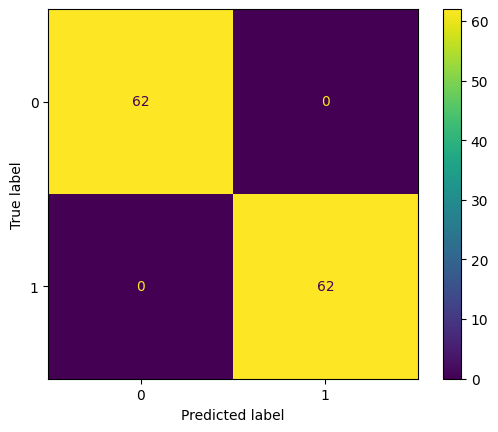

In [7]:
predictions = dt.predict(x_monk1_tr)

cm = confusion_matrix(y_monk1_tr, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

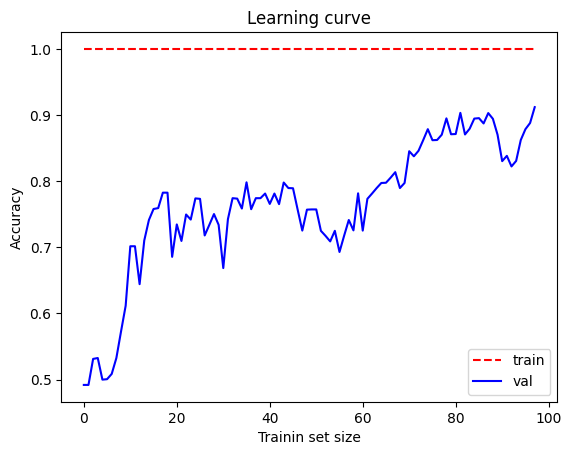

In [16]:
plot_learning_curve(dt,x_monk1_tr,y_monk1_tr)

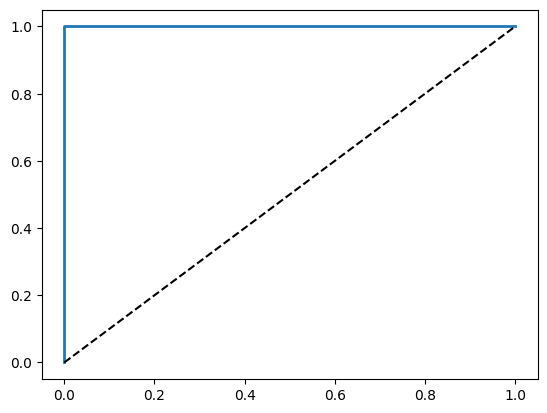

In [23]:
predictions = dt.predict(x_monk1_ts)
fpr, tpr, thresholds = roc_curve(y_monk1_ts,predictions)
plot_roc_curve(fpr,tpr)

In [24]:
score = dt.score(x_monk1_tr, y_monk1_tr)
print("Final accuracy on the training set: " + str(score))

Final accuracy on the training set: 1.0


# Model assesment

In [25]:
print("Final accuracy on the test set: " + str(dt.score(x_monk1_ts, y_monk1_ts)))

Final accuracy on the test set: 1.0


# RandomForest gridsearch

In [26]:
param_grid = {
    'n_estimators': np.arange(80, 150, 10),
    'ccp_alpha': [0.0, 0.1, 0.05, 0.01, 0.005, 0.001],
    'min_weight_fraction_leaf': [0.0, 0.1, 0.05, 0.01, 0.005, 0.001],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [1, 2, 3],
}

rf = RandomForestClassifier()

grid = GridSearchCV(
    rf,
    param_grid,
    cv=5,
    scoring='accuracy',
    return_train_score=False,
    verbose=4
)

grid.fit(x_monk1_tr, y_monk1_tr)

print(
    "The best parameters are %s with a score of %0.5f"
    % (grid.best_params_, grid.best_score_)
)

Fitting 5 folds for each of 2268 candidates, totalling 11340 fits
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.920 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.840 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.840 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estim

[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.958 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.920 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_

[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.880 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.920 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estim

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_e

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.917 total time=   0.1s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, 

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.880 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=

[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.800 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=

[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, 

[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.920 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=

[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.833 total time=   0.1s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimato

[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.760 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estim

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_e

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=

[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estim

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.880 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_esti

[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.958 total time=   0.1s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, 

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=

[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.917 total time=   0.1s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.800 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, 

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.960 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=

[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimato

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estim

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, 

[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001,

[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estim

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, 

[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005,

[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=

[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estim

[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_esti

[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.0, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=

[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimato

[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.680 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_esti

[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, 

[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001,

[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estim

[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, 

[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.680 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005,

[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estim

[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_es

[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.680 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.680 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators

[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.05, n_esti

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, 

[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.760 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001,

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estim

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, 

[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005,

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estim

[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01, n_es

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estim

[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.680 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05, n_esti

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.760 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, 

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=

[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.680 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimator

[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, 

[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005,

[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=

[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.680 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estim

[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.760 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_est

[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.1, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=

[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, 

[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05,

[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf

[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf

[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.917 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.800 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, 

[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.760 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf

[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf

[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.800 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=3, min_weight_fractio

[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.680 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_

[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.760 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.800 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.917 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0

[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.760 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=1, min_samples_split=4, min_weight_fractio

[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.760 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_esti

[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, 

[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf

[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.840 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_l

[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, 

[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05

[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.680 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf

[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=3, min_weight_fractio

[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.720 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_est

[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.760 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf

[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fractio

[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.800 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.720 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf

[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.800 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, 

[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.680 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.760 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0

[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.760 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.917 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=2, min_weight_fractio

[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.680 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.800 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, 

[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05,

[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.760 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.800 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.833 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf

[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.720 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=3, min_weight_fractio

[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_es

[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf

[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.760 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.680 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fractio

[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.760 total time=   0.1s
[CV 3/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.760 total time=   0.1s
[CV 4/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.05, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.833 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fractio

[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, 

[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01,

[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.920 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=2, min_weight_fractio

[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, 

[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05,

[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf

[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.920 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_

[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.920 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.833 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, 

[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf

[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf

[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.840 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=1, min_samples_split=4, min_weight_fractio

[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.800 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, 

[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01,

[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=2, min_weight_fractio

[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, 

[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.600 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05,

[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.833 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf

[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=3, min_weight_fractio

[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.760 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_esti

[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf

[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fractio

[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.917 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, 

[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, 

[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf

[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_le

[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, 

[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf

[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf

[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.917 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=3, min_weight_fractio

[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.760 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, 

[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.0

[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.640 total time=   0.1s
[CV 5/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.01, min_samples_leaf=3, min_samples_split=4, min_weight_fractio

[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_lea

[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_lea

[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fracti

[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.920 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.920 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=2, min_weight_fracti

[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.840 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.958 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_lea

[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fracti

[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.960 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fracti

[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.920 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=3, min_weight_

[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=

[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fracti

[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.920 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_

[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.840 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_lea

[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.840 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_lea

[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_le

[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=2, min_weight_

[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_lea

[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_lea

[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fracti

[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=3, min_weight_fr

[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.833 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf

[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fracti

[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fracti

[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.840 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.917 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=2, min_samples_split=4, min_weight_

[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_lea

[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_

[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=2, min_weight_

[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0,

[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.840 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_lea

[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fracti

[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=3, min_weight_f

[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_lea

[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_le

[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fracti

[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, min_samples_leaf=3, min_samples_split=4, min_weight_

[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.840 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=140;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.760 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0

[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fracti

[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.833 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.840 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.920 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fracti

[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.833 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.920 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=2, min_weight_

[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.600 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_lea

[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_lea

[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.920 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=3, min_weight_

[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.840 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=

[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.840 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.833 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_lea

[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fracti

[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.917 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=90;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=1, min_samples_split=4, min_weight_fracti

[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=130;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_lea

[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=100;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.05, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fracti

[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.875 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.960 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=80;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fracti

[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=120;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=2, min_weight_

[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.1, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.1

[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=140;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fracti

[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.960 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.875 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005, n_estimators=110;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_

[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.833 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0, n_estimators=80;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fracti

[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.840 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.680 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=110;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=120;, score=0.760 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_lea

[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.800 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_lea

[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=120;, score=0.917 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=130;, score=0.880 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=2, min_samples_split=4, min_weight_

[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.800 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=90;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.

[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=130;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.800 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=140;, score=0.880 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_lea

[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.880 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01, n_estimators=110;, score=0.750 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fracti

[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.800 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005, n_estimators=140;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001, n_estimators=80;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=2, min_weight_frac

[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=110;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0, n_estimators=120;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_lea

[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.920 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05, n_estimators=90;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_lea

[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=130;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.840 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fracti

[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.720 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=100;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.001, n_estimators=110;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=3, min_weight_

[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.760 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.800 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.640 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=80;, score=0.792 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1, n_estimators=90;, score=0.760 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1,

[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=120;, score=0.792 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.800 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05, n_estimators=130;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fracti

[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.760 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=90;, score=0.750 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.800 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.840 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.880 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005, n_estimators=100;, score=0.680 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fr

[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.720 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=130;, score=0.833 total time=   0.1s
[CV 1/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.760 total time=   0.1s
[CV 2/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.840 total time=   0.1s
[CV 3/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.920 total time=   0.1s
[CV 4/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.001, n_estimators=140;, score=0.760 total time=   0.1s
[CV 5/5] END ccp_alpha=0.001, min_samples_leaf=3, min_samples_split=4, min_weight_

In [27]:
rf = grid.best_estimator_
rf

RandomForestClassifier(ccp_alpha=0.01, min_samples_split=3,
                       min_weight_fraction_leaf=0.001, n_estimators=120)

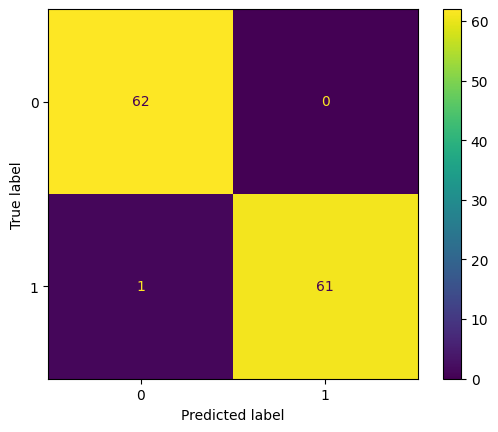

In [28]:
predictions = rf.predict(x_monk1_tr)

cm = confusion_matrix(y_monk1_tr, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

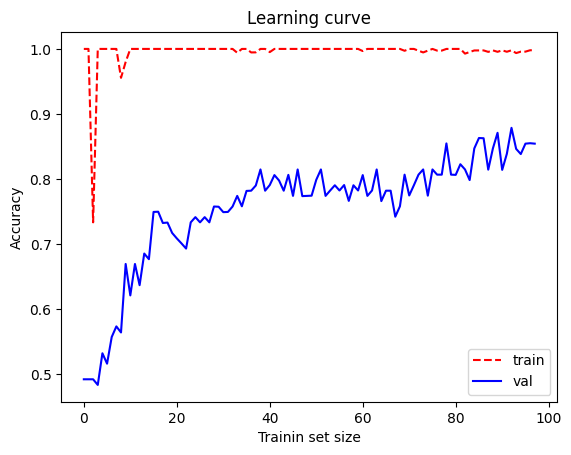

In [30]:
plot_learning_curve(rf,x_monk1_tr,y_monk1_tr)

In [31]:
score = rf.score(x_monk1_tr, y_monk1_tr)
print("Final accuracy on the training set: " + str(score))

Final accuracy on the training set: 0.9919354838709677


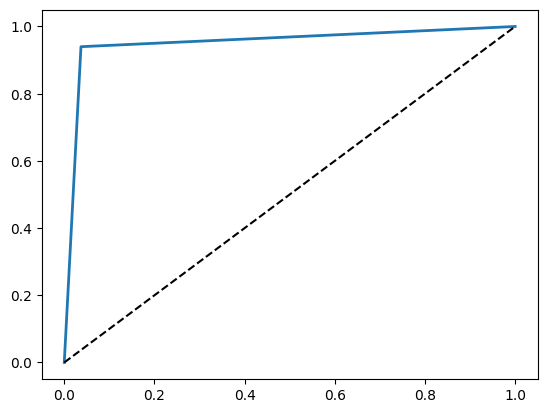

In [33]:
predictions = rf.predict(x_monk1_ts)
fpr, tpr, thresholds = roc_curve(y_monk1_ts,predictions)
plot_roc_curve(fpr,tpr)

In [34]:
print("Final accuracy on the test set: " + str(rf.score(x_monk1_ts, y_monk1_ts)))

Final accuracy on the test set: 0.9513888888888888


# Monk2

In [35]:
colnames = ['class', 'a1', 'a2', 'a3', 'a4', 'a5', 'a6', 'id']
monk2_tr = pd.read_csv("./data/monks-2.train", sep = " ", skipinitialspace=True, names = colnames)
monk2_tr = monk2_tr.drop('id', axis = 1)

monk2_ts = pd.read_csv("./data/monks-2.test", sep = " ", skipinitialspace=True, names = colnames)
monk2_ts = monk2_ts.drop('id', axis = 1)

In [36]:
x_monk2_tr = monk2_tr.iloc[:, 1:7].values
y_monk2_tr = monk2_tr.iloc[:, 0].values

x_monk2_ts = monk2_ts.iloc[:, 1:7].values
y_monk2_ts = monk2_ts.iloc[:, 0].values

In [37]:
one_hot_encoder_tr = OneHotEncoder(sparse=False)
one_hot_encoder_tr.fit(x_monk2_tr)
x_monk2_tr = one_hot_encoder_tr.transform(x_monk2_tr)

one_hot_encoder_ts = OneHotEncoder(sparse=False)
one_hot_encoder_ts.fit(x_monk2_ts)
x_monk2_ts = one_hot_encoder_ts.transform(x_monk2_ts)

In [39]:
param_grid = {
    'ccp_alpha': [0.0, 0.1, 0.05, 0.01, 0.005, 0.001, 0.0005, 0.0001, 0.5, 0.2],
    'min_weight_fraction_leaf': [0.0, 0.1, 0.05, 0.01, 0.005, 0.001, 0.0005, 0.0001, 0.5, 0.2],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [1, 2, 3],
    'max_depth': [4, 10, 40, 80, 120, None]
}


dt = tree.DecisionTreeClassifier()

grid = GridSearchCV(
    dt,
    param_grid,
    cv=5,
    scoring='accuracy',
    return_train_score=False,
    verbose=4
)


grid.fit(x_monk2_tr, y_monk2_tr)
print(
    "The best parameters are %s with a score of %0.5f"
    % (grid.best_params_, grid.best_score_)
)

Fitting 5 folds for each of 5400 candidates, totalling 27000 fits
[CV 1/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.471 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.324 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.500 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.529 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, max_depth=4, min_samples_leaf=1, min_sampl

[CV 3/5] END ccp_alpha=0.0, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.559 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.788 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.706 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.706 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.005;, score

[CV 1/5] END ccp_alpha=0.0, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0005;, score=0.647 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0005;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0005;, score=0.529 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0005;, score=0.647 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0005;, score=0.848 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0001;, score=0.676 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.00

[CV 5/5] END ccp_alpha=0.0, max_depth=80, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.455 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, max_depth=80, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.559 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, max_depth=80, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, max_depth=80, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.559 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, max_depth=80, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, max_depth=80, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.697 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, max_depth=80, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.

[CV 1/5] END ccp_alpha=0.0, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.441 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.471 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.500 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.500 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.667 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.529 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.2

[CV 5/5] END ccp_alpha=0.0, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0005;, score=0.667 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0001;, score=0.441 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0001;, score=0.471 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0001;, score=0.500 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0001;, score=0.500 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.0001;, score=0.606 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_frac

[CV 4/5] END ccp_alpha=0.1, max_depth=10, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, max_depth=10, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.01;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, max_depth=10, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, max_depth=10, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, max_depth=10, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, max_depth=10, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, max_depth=10, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.005;, scor

[CV 4/5] END ccp_alpha=0.1, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.6

[CV 4/5] END ccp_alpha=0.1, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1;, score=0.636 tota

[CV 3/5] END ccp_alpha=0.1, max_depth=120, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.5;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, max_depth=120, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.5;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, max_depth=120, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.5;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, max_depth=120, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, max_depth=120, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, max_depth=120, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, max_depth=120, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.6

[CV 1/5] END ccp_alpha=0.1, max_depth=None, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, max_depth=None, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, max_depth=None, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, max_depth=None, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, max_depth=None, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.1, max_depth=None, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.5;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, max_depth=None, min_samples_leaf=2, min_samples_split=2, min_weight_fractio

[CV 3/5] END ccp_alpha=0.05, max_depth=4, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, max_depth=4, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, max_depth=4, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, max_depth=4, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, max_depth=4, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, max_depth=4, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, max_depth=4, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.0;, score=0.618 tota

[CV 4/5] END ccp_alpha=0.05, max_depth=10, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, max_depth=10, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, max_depth=10, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, max_depth=10, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, max_depth=10, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, max_depth=10, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, max_depth=10, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, scor

[CV 3/5] END ccp_alpha=0.05, max_depth=40, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, max_depth=40, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, max_depth=40, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, max_depth=40, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, max_depth=40, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, max_depth=40, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, max_depth=40, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005;

[CV 4/5] END ccp_alpha=0.05, max_depth=80, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, max_depth=80, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, max_depth=80, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, max_depth=80, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, max_depth=80, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, max_depth=80, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, max_depth=80, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01;, sc

[CV 4/5] END ccp_alpha=0.05, max_depth=None, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, max_depth=None, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.05, max_depth=None, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.05, max_depth=None, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.05, max_depth=None, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.05, max_depth=None, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.05, max_depth=None, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0

[CV 1/5] END ccp_alpha=0.01, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.529 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.545 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, max_depth=4, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.500 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, max_depth=4, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.324 tota

[CV 4/5] END ccp_alpha=0.01, max_depth=10, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1;, score=0.500 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, max_depth=10, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.1;, score=0.545 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, max_depth=10, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.500 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, max_depth=10, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.294 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, max_depth=10, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.441 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, max_depth=10, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.559 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, max_depth=10, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.05;, scor

[CV 3/5] END ccp_alpha=0.01, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.5;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.5;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.5;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.529 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.6

[CV 2/5] END ccp_alpha=0.01, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0005;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0005;, score=0.559 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0005;, score=0.559 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0005;, score=0.667 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.382 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_le

[CV 1/5] END ccp_alpha=0.01, max_depth=120, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.382 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, max_depth=120, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, max_depth=120, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.588 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, max_depth=120, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.559 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, max_depth=120, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.727 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, max_depth=120, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.001;, score=0.382 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, max_depth=120, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_l

[CV 2/5] END ccp_alpha=0.01, max_depth=None, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.294 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, max_depth=None, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.441 total time=   0.0s
[CV 4/5] END ccp_alpha=0.01, max_depth=None, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.559 total time=   0.0s
[CV 5/5] END ccp_alpha=0.01, max_depth=None, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.455 total time=   0.0s
[CV 1/5] END ccp_alpha=0.01, max_depth=None, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.382 total time=   0.0s
[CV 2/5] END ccp_alpha=0.01, max_depth=None, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.01, max_depth=None, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_

[CV 2/5] END ccp_alpha=0.005, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.324 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.529 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.545 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.471 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.324 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.0

[CV 2/5] END ccp_alpha=0.005, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.471 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.529 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.500 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.412 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.471 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=

[CV 5/5] END ccp_alpha=0.005, max_depth=40, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.1;, score=0.545 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, max_depth=40, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.441 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, max_depth=40, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.294 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, max_depth=40, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.471 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, max_depth=40, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.559 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, max_depth=40, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, max_depth=40, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.0

[CV 3/5] END ccp_alpha=0.005, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.647 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.848 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.529 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.294 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.412 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0

[CV 4/5] END ccp_alpha=0.005, max_depth=None, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, max_depth=None, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.545 total time=   0.0s
[CV 1/5] END ccp_alpha=0.005, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.005, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.005, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.529 total time=   0.0s
[CV 4/5] END ccp_alpha=0.005, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.005, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction

[CV 1/5] END ccp_alpha=0.001, max_depth=4, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.471 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, max_depth=4, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, max_depth=4, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.529 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, max_depth=4, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, max_depth=4, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.545 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, max_depth=4, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0;, score=0.471 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, max_depth=4, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0;, score=0.3

[CV 4/5] END ccp_alpha=0.001, max_depth=10, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, max_depth=10, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0;, score=0.758 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, max_depth=10, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.529 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, max_depth=10, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.294 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, max_depth=10, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.412 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, max_depth=10, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.529 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, max_depth=10, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.1;, sc

[CV 5/5] END ccp_alpha=0.001, max_depth=40, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.1;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, max_depth=40, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.382 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, max_depth=40, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.559 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, max_depth=40, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.471 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, max_depth=40, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.559 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, max_depth=40, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, max_depth=40, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0

[CV 5/5] END ccp_alpha=0.001, max_depth=80, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.455 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, max_depth=80, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.588 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, max_depth=80, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, max_depth=80, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.500 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, max_depth=80, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, max_depth=80, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.727 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, max_depth=80, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.

[CV 2/5] END ccp_alpha=0.001, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.559 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.471 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.559 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.455 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01;, score=0.441 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01;, score=0.471 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, max_depth=120, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_

[CV 2/5] END ccp_alpha=0.001, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.559 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.471 total time=   0.0s
[CV 4/5] END ccp_alpha=0.001, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.559 total time=   0.0s
[CV 5/5] END ccp_alpha=0.001, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.001, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.412 total time=   0.0s
[CV 2/5] END ccp_alpha=0.001, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.471 total time=   0.0s
[CV 3/5] END ccp_alpha=0.001, max_depth=None, min_samples_leaf=3, min_samples_split=3, min_weight_fr

[CV 4/5] END ccp_alpha=0.0005, max_depth=4, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.5;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0005, max_depth=4, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.5;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0005, max_depth=4, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.471 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0005, max_depth=4, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0005, max_depth=4, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.529 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0005, max_depth=4, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0005, max_depth=4, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.2;, sc

[CV 4/5] END ccp_alpha=0.0005, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.706 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0005, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0005, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.1;, score=0.529 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0005, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.1;, score=0.294 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0005, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.1;, score=0.412 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0005, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.1;, score=0.529 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0005, max_depth=40, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0

[CV 2/5] END ccp_alpha=0.0005, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0005, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.500 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0005, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0005, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.818 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0005, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005;, score=0.647 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0005, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0005, max_depth=80, min_samples_leaf=1, min_samples_split=4, min_weight_fractio

[CV 2/5] END ccp_alpha=0.0005, max_depth=120, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0005, max_depth=120, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.559 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0005, max_depth=120, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0005, max_depth=120, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.727 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0005, max_depth=120, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0005;, score=0.647 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0005, max_depth=120, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0005;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0005, max_depth=120, min_samples_leaf=2, min_samples_split=2, min_w

[CV 3/5] END ccp_alpha=0.0005, max_depth=None, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0001;, score=0.500 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0005, max_depth=None, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0005, max_depth=None, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0001;, score=0.667 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0005, max_depth=None, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.5;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0005, max_depth=None, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.5;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0005, max_depth=None, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.5;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0005, max_depth=None, min_samples_leaf=2, min_samples_split=3, min

[CV 2/5] END ccp_alpha=0.0001, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.324 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0001, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.500 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0001, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0001, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.005;, score=0.545 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0001, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.471 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0001, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.324 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0001, max_depth=4, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_l

[CV 1/5] END ccp_alpha=0.0001, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.471 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0001, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0001, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.529 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0001, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0001, max_depth=10, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.545 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0001, max_depth=10, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.0;, score=0.441 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0001, max_depth=10, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0

[CV 5/5] END ccp_alpha=0.0001, max_depth=80, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.1;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0001, max_depth=80, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.441 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0001, max_depth=80, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.559 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0001, max_depth=80, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.471 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0001, max_depth=80, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.559 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0001, max_depth=80, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0001, max_depth=80, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_l

[CV 5/5] END ccp_alpha=0.0001, max_depth=120, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.05;, score=0.455 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0001, max_depth=120, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.500 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0001, max_depth=120, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0001, max_depth=120, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.559 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0001, max_depth=120, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0001, max_depth=120, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.697 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0001, max_depth=120, min_samples_leaf=1, min_samples_split=3, min_weight_fr

[CV 4/5] END ccp_alpha=0.0001, max_depth=None, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005;, score=0.647 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0001, max_depth=None, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.005;, score=0.697 total time=   0.0s
[CV 1/5] END ccp_alpha=0.0001, max_depth=None, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001;, score=0.676 total time=   0.0s
[CV 2/5] END ccp_alpha=0.0001, max_depth=None, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001;, score=0.500 total time=   0.0s
[CV 3/5] END ccp_alpha=0.0001, max_depth=None, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001;, score=0.559 total time=   0.0s
[CV 4/5] END ccp_alpha=0.0001, max_depth=None, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.001;, score=0.647 total time=   0.0s
[CV 5/5] END ccp_alpha=0.0001, max_depth=None, min_samples_leaf=1, min_samples_split=4, 

[CV 2/5] END ccp_alpha=0.5, max_depth=4, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.5, max_depth=4, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.5, max_depth=4, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.5, max_depth=4, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.5, max_depth=4, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.5, max_depth=4, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.5, max_depth=4, min_samples_leaf=2, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.618 total time=

[CV 2/5] END ccp_alpha=0.5, max_depth=10, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.5, max_depth=10, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.5, max_depth=10, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.5, max_depth=10, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.05;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.5, max_depth=10, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.5, max_depth=10, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.5, max_depth=10, min_samples_leaf=2, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.6

[CV 2/5] END ccp_alpha=0.5, max_depth=40, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.5, max_depth=40, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.5, max_depth=40, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.5, max_depth=40, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.05;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.5, max_depth=40, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.5, max_depth=40, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.5, max_depth=40, min_samples_leaf=3, min_samples_split=2, min_weight_fraction_leaf=0.01;, score=0.6

[CV 3/5] END ccp_alpha=0.5, max_depth=80, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.5, max_depth=80, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.5, max_depth=80, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.01;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.5, max_depth=80, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.5, max_depth=80, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.5, max_depth=80, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.5, max_depth=80, min_samples_leaf=3, min_samples_split=3, min_weight_fraction_leaf=0.005;, score

[CV 2/5] END ccp_alpha=0.5, max_depth=120, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.5, max_depth=120, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.5, max_depth=120, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.5, max_depth=120, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.01;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.5, max_depth=120, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.5, max_depth=120, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.5, max_depth=120, min_samples_leaf=3, min_samples_split=4, min_weight_fraction_leaf=0.005;,

[CV 1/5] END ccp_alpha=0.2, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.2, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.2, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.2, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.2, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.001;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.2, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0005;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.2, max_depth=4, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0005;, score=0

[CV 1/5] END ccp_alpha=0.2, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.2, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.2, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.2, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.2, max_depth=10, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.2, max_depth=10, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.2, max_depth=10, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0;, score=0.618 tota

[CV 4/5] END ccp_alpha=0.2, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0005;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.2, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0005;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.2, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.2, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.2, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.2, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.2, max_depth=40, min_samples_leaf=1, min_samples_split=4, min_weight_fraction_leaf=0.00

[CV 5/5] END ccp_alpha=0.2, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0005;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.2, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.2, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.2, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.2, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.2, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.0001;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.2, max_depth=80, min_samples_leaf=2, min_samples_split=2, min_weight_fraction_leaf=0.5;

[CV 5/5] END ccp_alpha=0.2, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.5;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.2, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.2, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.2, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.2, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.2, max_depth=120, min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.2;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.2, max_depth=120, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.0;, score=0.6

[CV 3/5] END ccp_alpha=0.2, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.5;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.2, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.5;, score=0.618 total time=   0.0s
[CV 5/5] END ccp_alpha=0.2, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.5;, score=0.636 total time=   0.0s
[CV 1/5] END ccp_alpha=0.2, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 2/5] END ccp_alpha=0.2, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 3/5] END ccp_alpha=0.2, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, score=0.618 total time=   0.0s
[CV 4/5] END ccp_alpha=0.2, max_depth=None, min_samples_leaf=1, min_samples_split=3, min_weight_fraction_leaf=0.2;, sc

The best parameters are {'ccp_alpha': 0.0005, 'max_depth': 80, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.005} with a score of 0.69340


In [40]:
dt = grid.best_estimator_
dt

DecisionTreeClassifier(ccp_alpha=0.0005, max_depth=80,
                       min_weight_fraction_leaf=0.005)

In [42]:
score = dt.score(x_monk2_tr, y_monk2_tr)
print("Final accuracy on the training set: " + str(score))

Final accuracy on the training set: 1.0


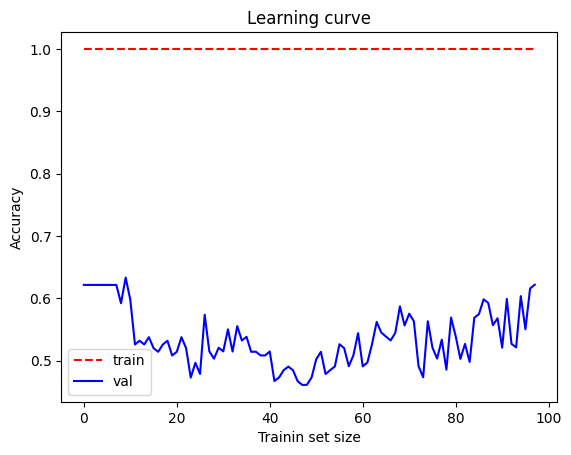

In [44]:
plot_learning_curve(dt,x_monk2_tr,y_monk2_tr)

# Model assesment

In [43]:
print("Final accuracy on the test set: " + str(dt.score(x_monk2_ts, y_monk2_ts)))

Final accuracy on the test set: 0.8171296296296297
